In [ ]:
import tensorflow as tf
tf.__version__
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
import h5py
import random
%matplotlib inline

In [ ]:
happy_train = h5py.File('train_happy.h5', "r")
happy_test  = h5py.File('test_happy.h5', "r")

In [ ]:
f = h5py.File('train_happy.h5', "r")
for key in f.keys():
    print(key) #Names of the groups in HDF5 file.

list_classes
train_set_x
train_set_y


In [ ]:
X_train = np.array(happy_train["train_set_x"][:]) 
y_train = np.array(happy_train["train_set_y"][:]) 

X_test = np.array(happy_test["test_set_x"][:])
y_test = np.array(happy_test["test_set_y"][:]) 

#**Dataset Visualization**

In [ ]:
X_train

array([[[[178, 190, 163],
         [172, 181, 173],
         [188, 196, 184],
         ...,
         [255, 255, 254],
         [254, 255, 250],
         [249, 253, 222]],

        [[184, 201, 165],
         [149, 154, 142],
         [149, 158, 139],
         ...,
         [255, 255, 253],
         [254, 255, 250],
         [251, 255, 230]],

        [[198, 207, 165],
         [141, 147, 128],
         [168, 184, 154],
         ...,
         [253, 255, 244],
         [254, 255, 248],
         [253, 255, 233]],

        ...,

        [[ 77,  82,  89],
         [ 60,  64,  68],
         [ 49,  53,  55],
         ...,
         [ 31,  32,  30],
         [ 47,  48,  46],
         [ 75,  75,  75]],

        [[ 68,  71,  76],
         [ 55,  58,  59],
         [ 44,  47,  47],
         ...,
         [ 30,  31,  29],
         [ 40,  41,  39],
         [ 63,  64,  63]],

        [[ 61,  64,  66],
         [ 52,  54,  54],
         [ 45,  47,  46],
         ...,
         [ 30,  31,  29],
        

In [ ]:
X_train.shape            # this shows dataset has 600 images , 64 pixels by 64 pixels with 3 dimensions

(600, 64, 64, 3)

In [ ]:
y_train

array([0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0,
       1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0,
       1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1,
       1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0,
       1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1,
       0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1,
       0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1,
       1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0,
       0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1,

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


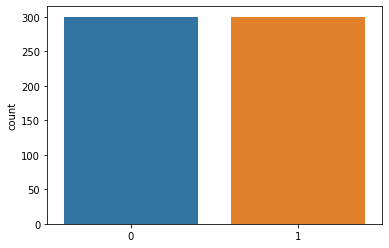

In [ ]:
import seaborn as sns
sns.countplot(y_train)

1


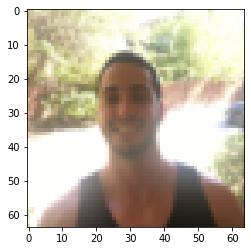

In [ ]:
i = random.randint(1,600)
plt.imshow(X_train[i])
print(y_train[i])                    #0 means sad :( , 1 means happy :)

0


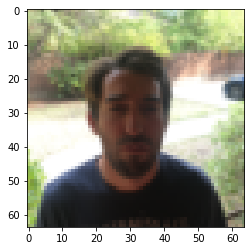

In [ ]:
i = random.randint(1,600)
plt.imshow(X_train[i])
print(y_train[i])                    #0 means sad :( , 1 means happy :)

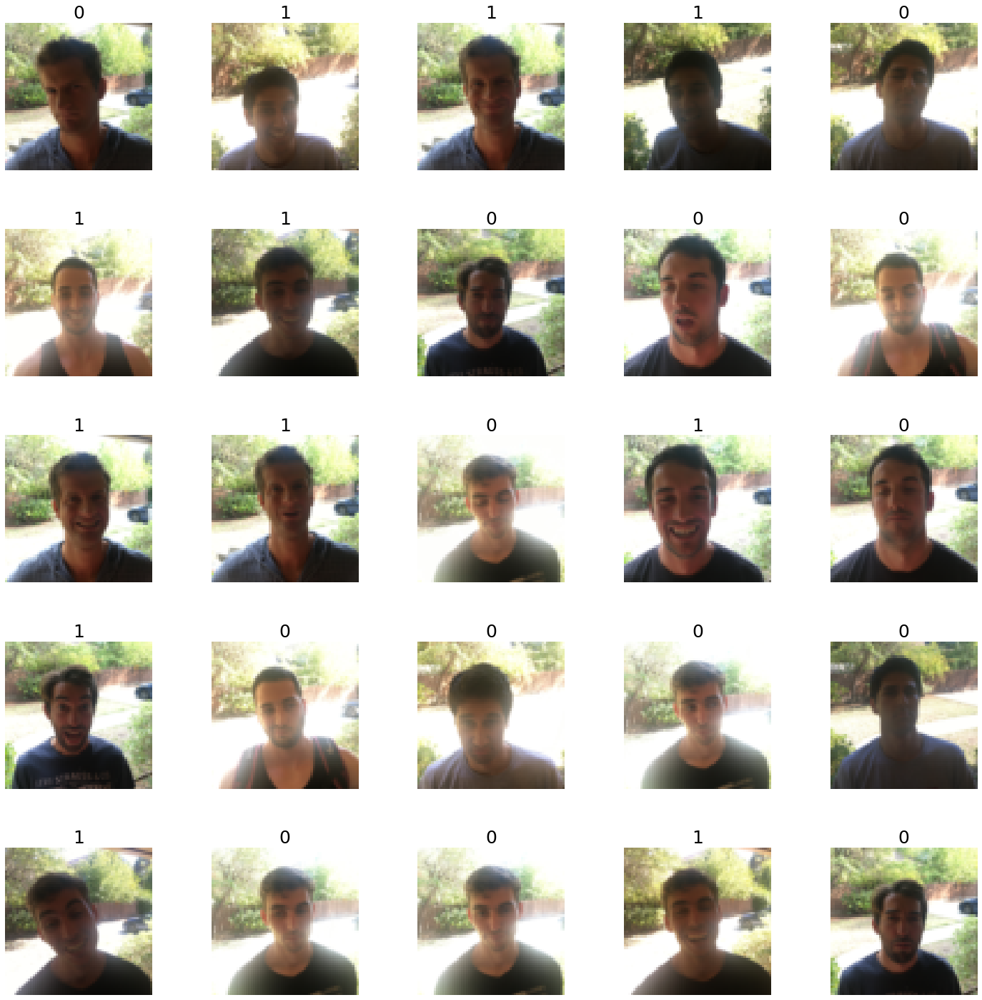

In [ ]:
W_grid = 5
L_grid = 5

# fig, axes = plt.subplots(L_grid, W_grid)
# subplot return the figure object and axes object
# we can use the axes object to plot specific figures at various locations

fig, axes = plt.subplots(L_grid, W_grid, figsize = (25,25))

axes = axes.ravel() # flaten the 15 x 15 matrix into 225 array

n_training = len(X_train) # get the length of the training dataset

# Select a random number from 0 to n_training
for i in np.arange(0, W_grid * L_grid): # create evenly spaces variables 

    # Select a random number
    index = np.random.randint(0, n_training)
    # read and display an image with the selected index    
    axes[i].imshow( X_train[index])
    axes[i].set_title(y_train[index], fontsize = 25)
    axes[i].axis('off')

plt.subplots_adjust(hspace=0.4)


In [ ]:
# Normalizing Data
X_train = X_train/255
X_test = X_test/255

In [ ]:
X_train

array([[[[0.69803922, 0.74509804, 0.63921569],
         [0.6745098 , 0.70980392, 0.67843137],
         [0.7372549 , 0.76862745, 0.72156863],
         ...,
         [1.        , 1.        , 0.99607843],
         [0.99607843, 1.        , 0.98039216],
         [0.97647059, 0.99215686, 0.87058824]],

        [[0.72156863, 0.78823529, 0.64705882],
         [0.58431373, 0.60392157, 0.55686275],
         [0.58431373, 0.61960784, 0.54509804],
         ...,
         [1.        , 1.        , 0.99215686],
         [0.99607843, 1.        , 0.98039216],
         [0.98431373, 1.        , 0.90196078]],

        [[0.77647059, 0.81176471, 0.64705882],
         [0.55294118, 0.57647059, 0.50196078],
         [0.65882353, 0.72156863, 0.60392157],
         ...,
         [0.99215686, 1.        , 0.95686275],
         [0.99607843, 1.        , 0.97254902],
         [0.99215686, 1.        , 0.91372549]],

        ...,

        [[0.30196078, 0.32156863, 0.34901961],
         [0.23529412, 0.25098039, 0.26666667]

In [ ]:
X_train.shape

(600, 64, 64, 3)

# **Model Training**

In [ ]:
# Training Model
cnn = tf.keras.Sequential()

cnn.add(tf.keras.layers.Conv2D(64, (6,6), activation = 'relu', input_shape = (64,64,3)))
cnn.add(tf.keras.layers.MaxPooling2D(2,2))

cnn.add(tf.keras.layers.Conv2D(64, (5,5), activation = 'relu'))
cnn.add(tf.keras.layers.MaxPooling2D(2,2))

cnn.add(tf.keras.layers.Flatten())

cnn.add(tf.keras.layers.Dense(128, activation = 'relu'))

cnn.add(tf.keras.layers.Dense(64, activation = 'relu'))

cnn.add(tf.keras.layers.Dense(1, activation = 'sigmoid'))
cnn.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 59, 59, 64)        6976      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 29, 29, 64)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 25, 25, 64)        102464    
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 12, 12, 64)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 9216)              0         
                                                                 
 dense_3 (Dense)             (None, 128)              

In [ ]:
cnn.compile(optimizer = 'Adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [ ]:
import datetime
# Clear any logs from previous runs
!rm -rf ./logs/

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
history = cnn.fit(X_train, y_train,batch_size = 30, epochs = 50, verbose = 1,callbacks = [tensorboard_callback])

Epoch 1/50
20/20 [==============================] - 10s 482ms/step - loss: 0.6976 - accuracy: 0.5533
Epoch 2/50
20/20 [==============================] - 9s 475ms/step - loss: 0.6044 - accuracy: 0.6667
Epoch 3/50
20/20 [==============================] - 9s 476ms/step - loss: 0.4545 - accuracy: 0.7867
Epoch 4/50
20/20 [==============================] - 9s 474ms/step - loss: 0.3150 - accuracy: 0.8583
Epoch 5/50
20/20 [==============================] - 9s 472ms/step - loss: 0.2479 - accuracy: 0.8983
Epoch 6/50
20/20 [==============================] - 9s 475ms/step - loss: 0.1766 - accuracy: 0.9317
Epoch 7/50
20/20 [==============================] - 9s 474ms/step - loss: 0.1653 - accuracy: 0.9383
Epoch 8/50
20/20 [==============================] - 9s 475ms/step - loss: 0.1570 - accuracy: 0.9483
Epoch 9/50
20/20 [==============================] - 9s 470ms/step - loss: 0.1271 - accuracy: 0.9500
Epoch 10/50
20/20 [==============================] - 9s 471ms/step - loss: 0.1169 - accuracy: 0.966

# **Prediction & Evaluation**

In [ ]:
evaluation = cnn.evaluate(X_test, y_test)
print('Test Accuracy : {:.3f}'.format(evaluation[1]))

5/5 [==============================] - 1s 130ms/step - loss: 0.2941 - accuracy: 0.9467
Test Accuracy : 0.947


In [ ]:
history.history.keys()

dict_keys(['loss', 'accuracy'])

In [ ]:
accuracy = history.history['accuracy']
loss = history.history['loss']

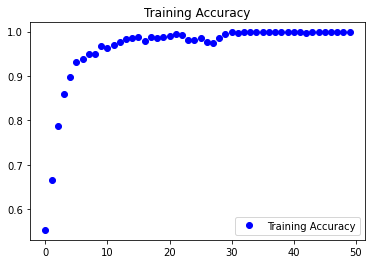

In [ ]:
epochs = range(len(accuracy))

plt.plot(epochs, accuracy, 'bo', label='Training Accuracy')
plt.title('Training Accuracy')
plt.legend()

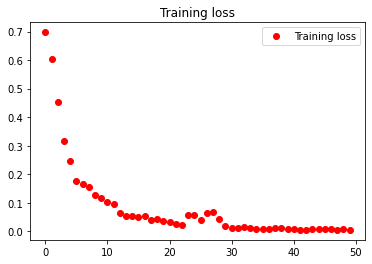

In [ ]:
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.title('Training loss')
plt.legend()

In [ ]:
y_pred = (cnn.predict(X_test) > 0.5).astype("int32")
y_true = y_test

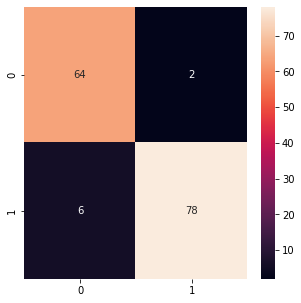

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize = (5, 5))
sns.heatmap(cm, annot = True)

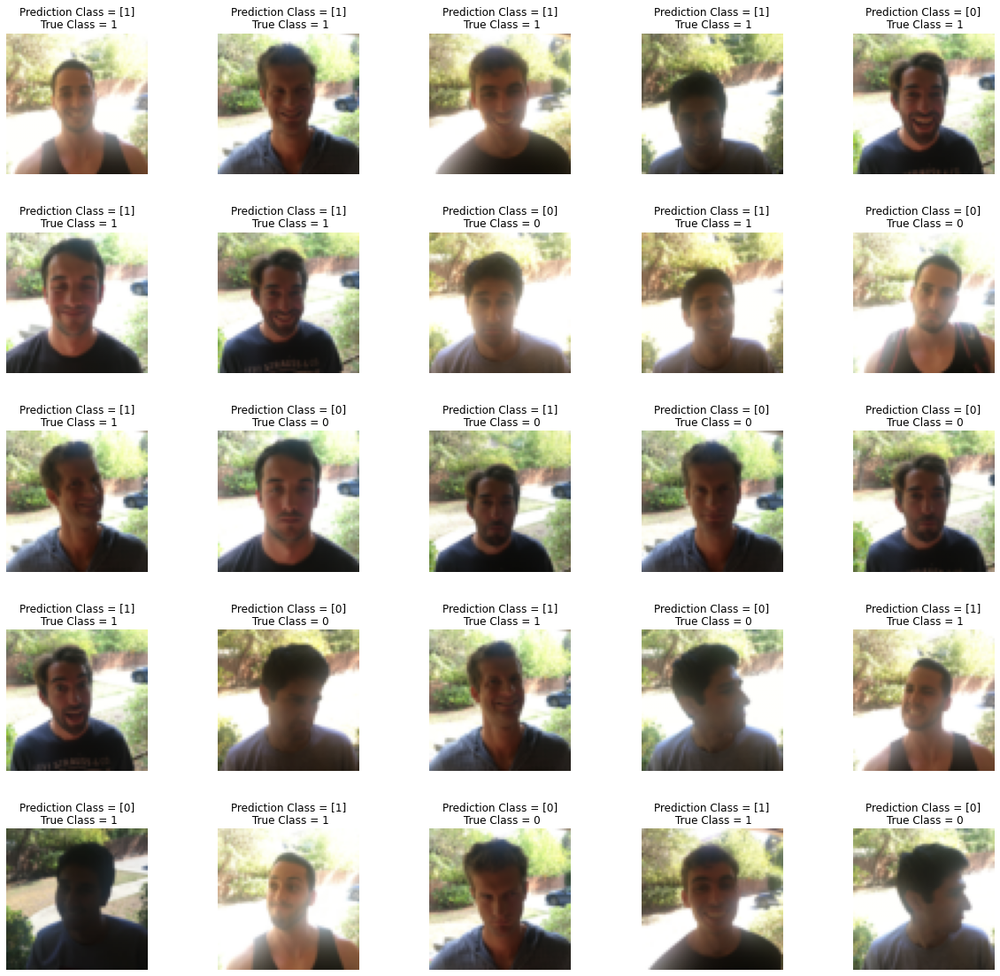

In [ ]:
L = 5
W = 5
fig, axes = plt.subplots(L, W, figsize = (20,20))
axes = axes.ravel() # 

for i in np.arange(0, L * W):  
    axes[i].imshow(X_test[i])
    axes[i].set_title("Prediction Class = {}\n True Class = {}".format(y_pred[i], y_test[i]))
    axes[i].axis('off')

plt.subplots_adjust(wspace=0.5)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test.T, y_pred))

              precision    recall  f1-score   support

           0       0.91      0.97      0.94        66
           1       0.97      0.93      0.95        84

    accuracy                           0.95       150
   macro avg       0.94      0.95      0.95       150
weighted avg       0.95      0.95      0.95       150



# **TensorBoard Visualization**
I have just learned & practicing how to use Tensorflow Board


In [ ]:
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 567), started 0:14:35 ago. (Use '!kill 567' to kill it.)

<IPython.core.display.Javascript object>